In [1]:
library('igraph')


Attaching package: ‘igraph’

The following objects are masked from ‘package:stats’:

    decompose, spectrum

The following object is masked from ‘package:base’:

    union



QUESTION 1: A first look at the network:

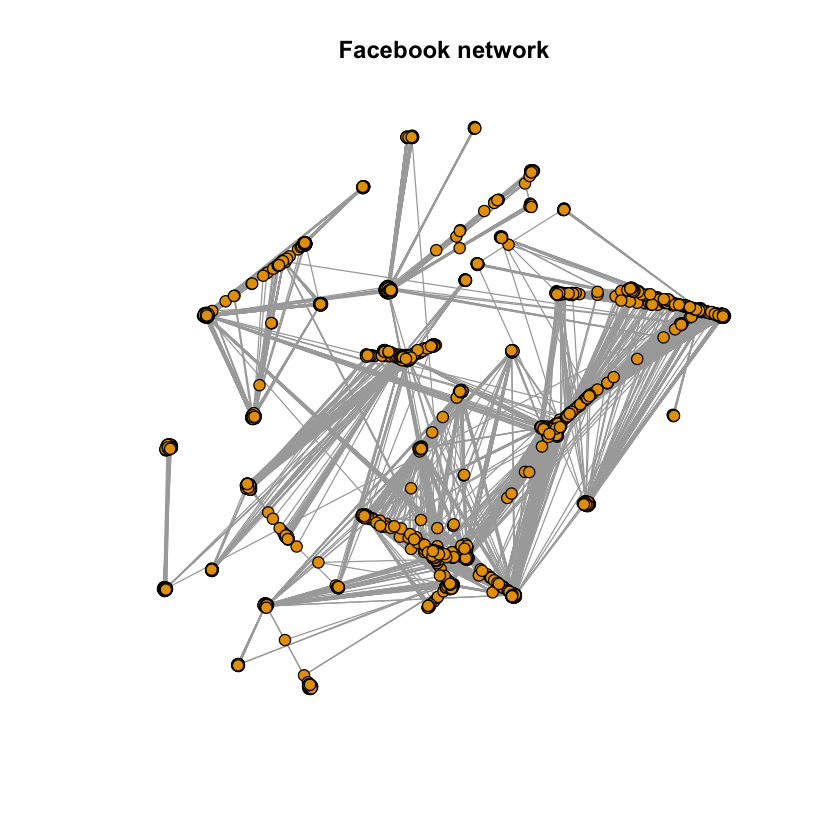

In [16]:
facebook_network <- read.graph("facebook_combined.txt", directed=FALSE)
plot(facebook_network, vertex.size=4, vertex.label=NA, main="Facebook network")

QUESTION 1.1: Report the number of nodes and number of edges of the Facebook network.

In [17]:
n_nodes <- gorder(facebook_network)
n_edges <- gsize(facebook_network)
n_nodes
n_edges

[1] 4039

[1] 88234

QUESTION 1.2: Is the Facebook network connected? If not, find the giant connected component
(GCC) of the network and report the size of the GCC.

In [18]:
is_connected(facebook_network)

[1] TRUE

QUESTION 2: Find the diameter of the network. If the network is not connected, then find the
diameter of the GCC.

In [19]:
diameter(facebook_network)

[1] 8

QUESTION 3: Plot the degree distribution of the facebook network and report the average
degree.

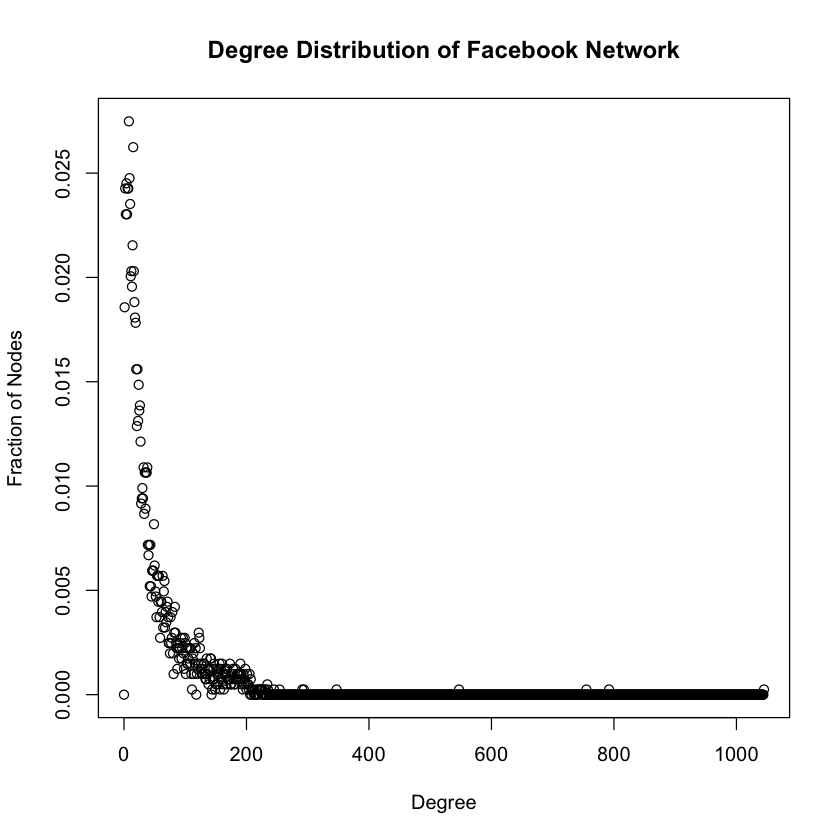

In [21]:
degree_dist <- degree_distribution(facebook_network)
degree_dist_df <- data.frame(x=seq_along(degree_dist)-1,y=degree_dist)
plot(degree_dist_df$x, degree_dist_df$y,
    xlab="Degree", ylab="Fraction of Nodes")
title(sprintf("Degree Distribution of Facebook Network"))

In [22]:
mean(degree(facebook_network))

[1] 43.69101

QUESTION 4: Plot the degree distribution of Question 3 in a log-log scale. Try to fit a line to
the plot and estimate the slope of the line.


Call:
lm(formula = y ~ x, data = log_deg_dist_df)

Coefficients:
(Intercept)            x  
    -0.9922      -1.1802  


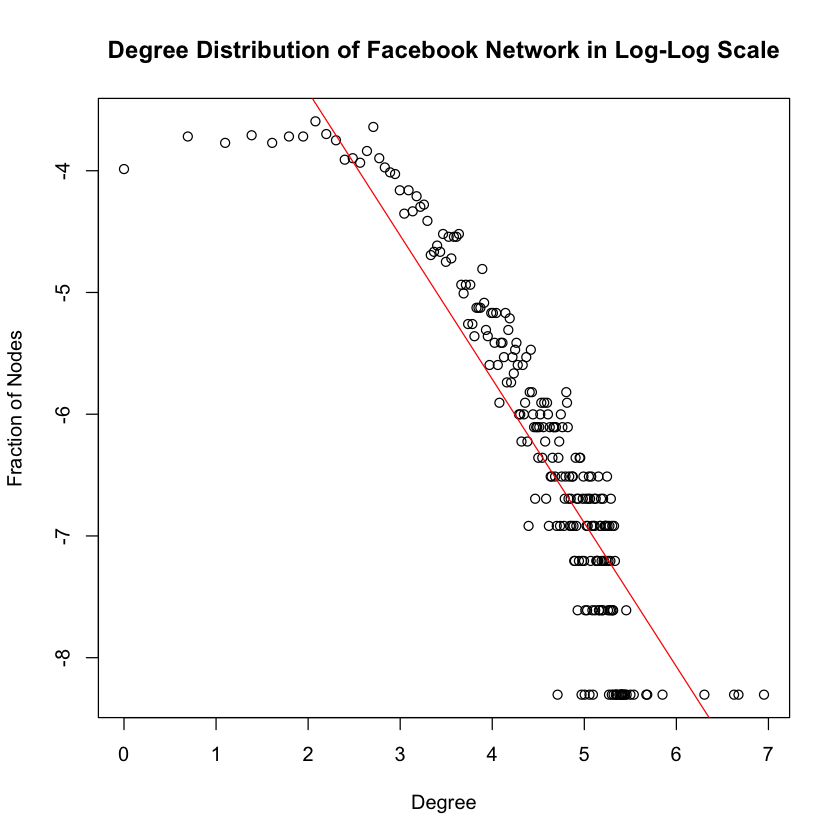

In [29]:
invalid_idx <- is.infinite(log(degree_dist))
log_deg_dist_df = log(degree_dist_df)[!invalid_idx,]
plot(log_deg_dist_df$x, log_deg_dist_df$y,
    xlab="Degree", ylab="Fraction of Nodes")
lm(y~x, log_deg_dist_df)
abline(lm(y~x, log_deg_dist_df), col="red")
title(sprintf("Degree Distribution of Facebook Network in Log-Log Scale"))

QUESTION 5: Create a personalized network of the user whose ID is 1. How many nodes and
edges does this personalized network have?

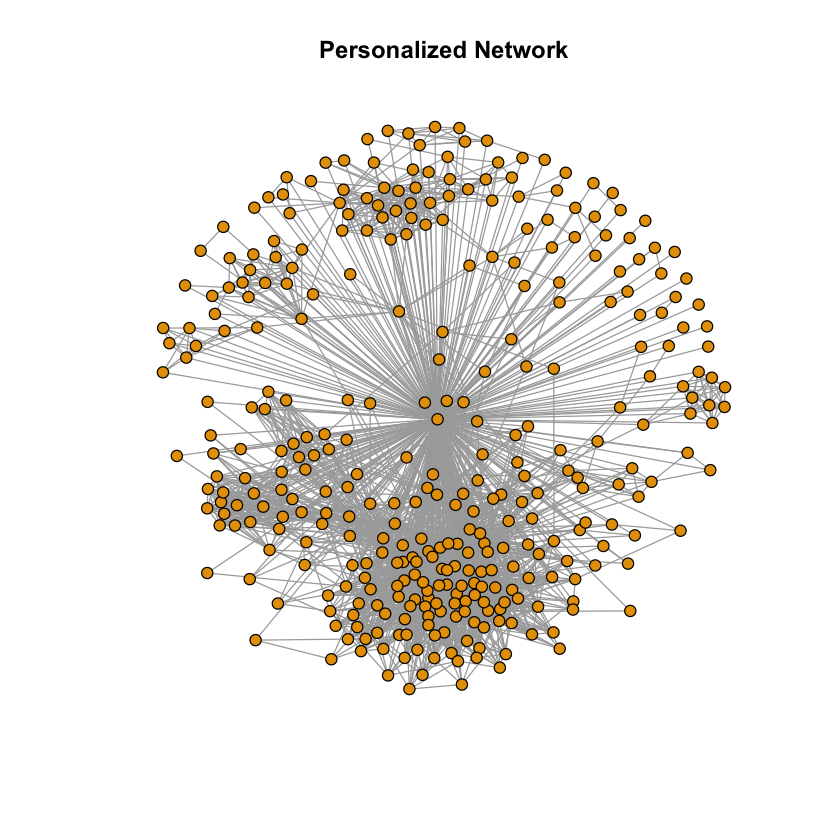

In [49]:
personalized_network <- make_ego_graph(facebook_network, order=1, nodes=V(facebook_network))[[1]]
# personalized_network
plot(personalized_network, vertex.size=4, vertex.label=NA, main="Personalized Network")

In [50]:
n_nodes <- gorder(personalized_network)
n_edges <- gsize(personalized_network)
n_nodes
n_edges

[1] 348

[1] 2866

QUESTION 6: What is the diameter of the personalized network? Please state a trivial upper
and lower bound for the diameter of the personalized network.

In [51]:
diameter(personalized_network)

[1] 2

QUESTION 8: How many core nodes are there in the Facebook network. What is the average
degree of the core nodes?

In [52]:
core_nodes <- which(ego_size(facebook_network, order=1, nodes=V(facebook_network))>201)
length(core_nodes)

[1] 40

In [54]:
mean(degree(facebook_network, V(facebook_network))[core_nodes])

[1] 279.375

QUESTION 9: For each of the above core node’s personalized network, find the community structure
using Fast-Greedy, Edge-Betweenness, and Infomap community detection algorithms. Compare
the modularity scores of the algorithms. For visualization purpose, display the community structure
of the core node’s personalized networks using colors. Nodes belonging to the same community
should have the same color and nodes belonging to different communities should have different
color. In this question, you should have 15 plots in total.

In [147]:
id_list = core_nodes[1:5]
id_list

[1]    1  108  349  484 1087

In [148]:
personalized_networks <- make_ego_graph(facebook_network, order=1, nodes=V(facebook_network))[id_list]

[1] "Node ID: 1"
[1] "Modularity of Fast-Greedy: 0.413101"
[1] "Modularity of Edge-Betweenness: 0.353302"
[1] "Modularity of Infomap: 0.389118"


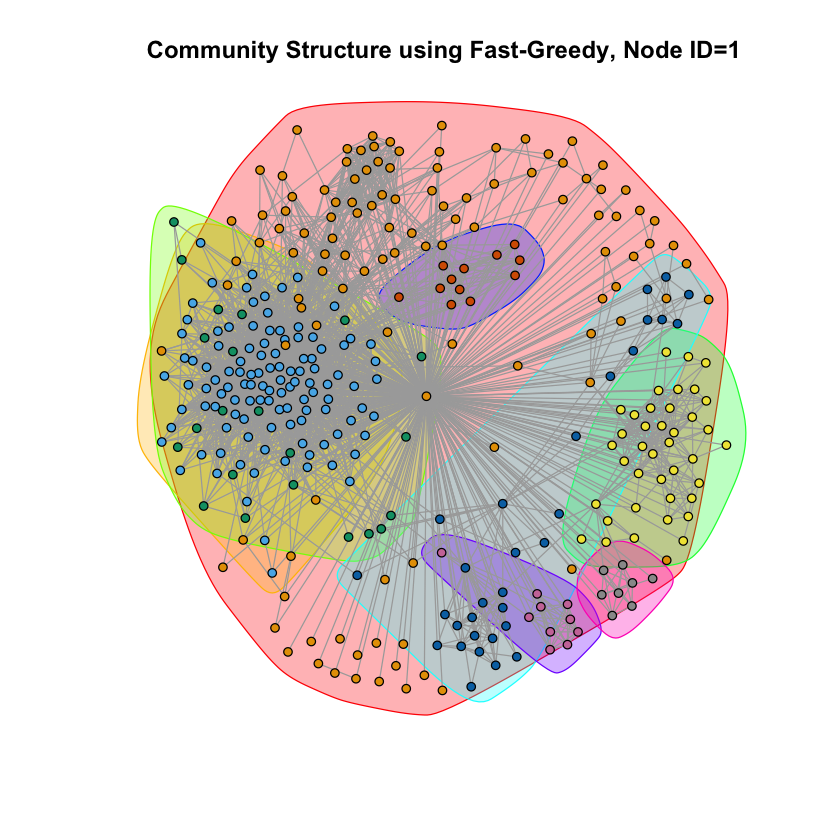

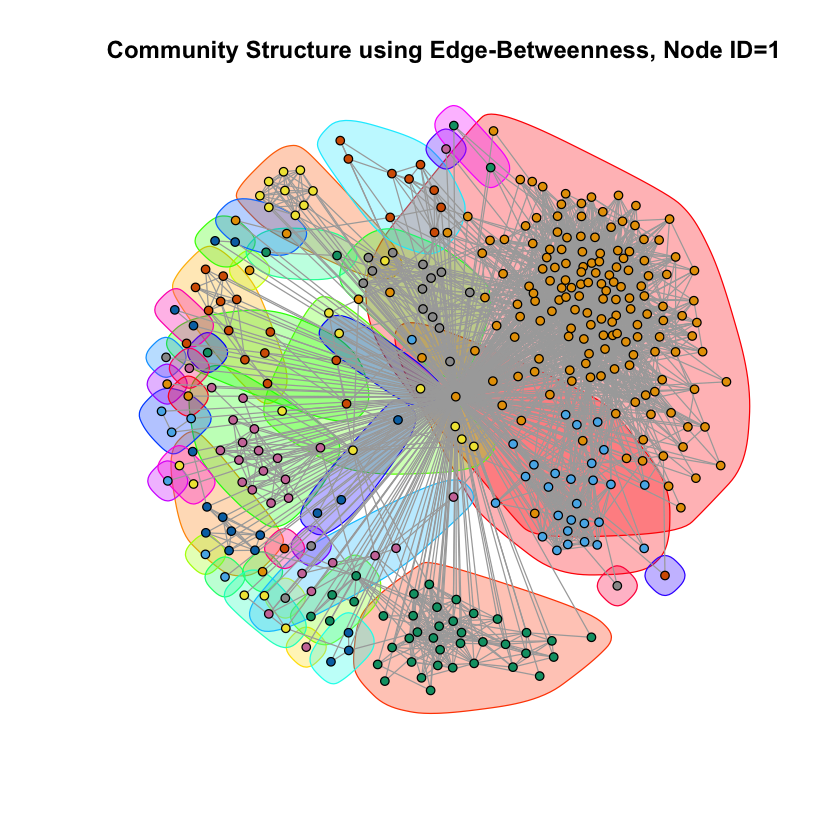

[1] "Node ID: 108"
[1] "Modularity of Fast-Greedy: 0.435929"
[1] "Modularity of Edge-Betweenness: 0.506755"
[1] "Modularity of Infomap: 0.508249"


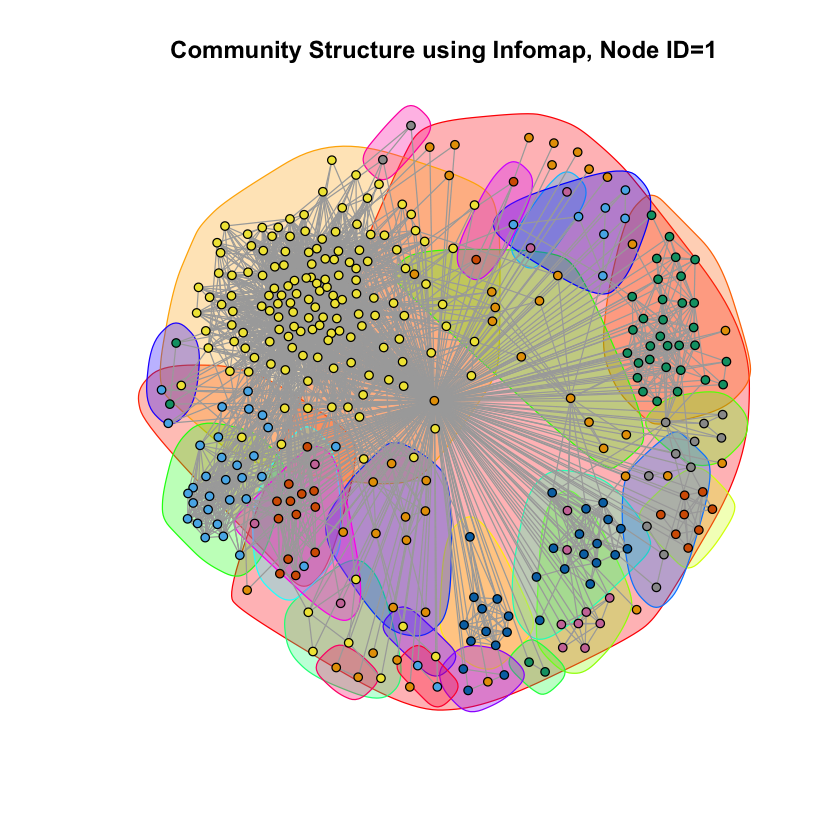

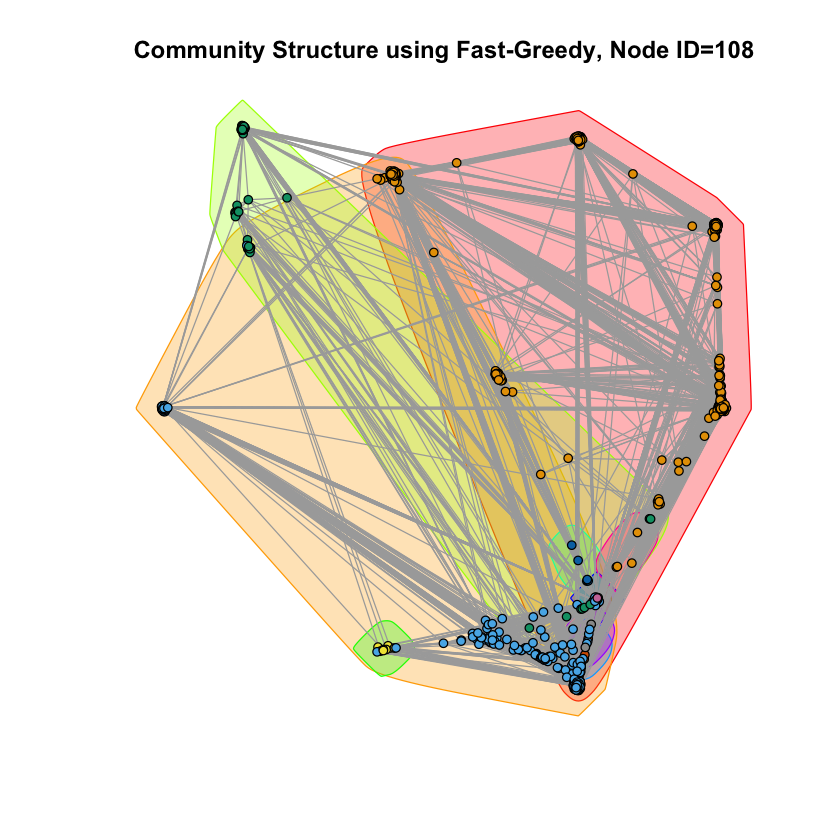

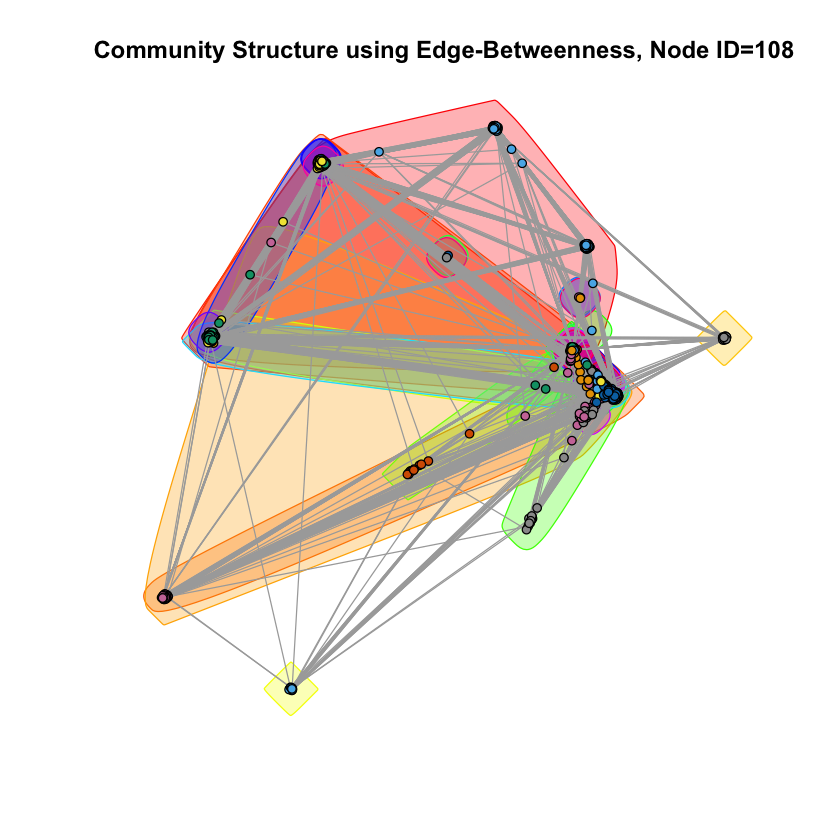

[1] "Node ID: 349"
[1] "Modularity of Fast-Greedy: 0.251715"
[1] "Modularity of Edge-Betweenness: 0.133528"
[1] "Modularity of Infomap: 0.203753"


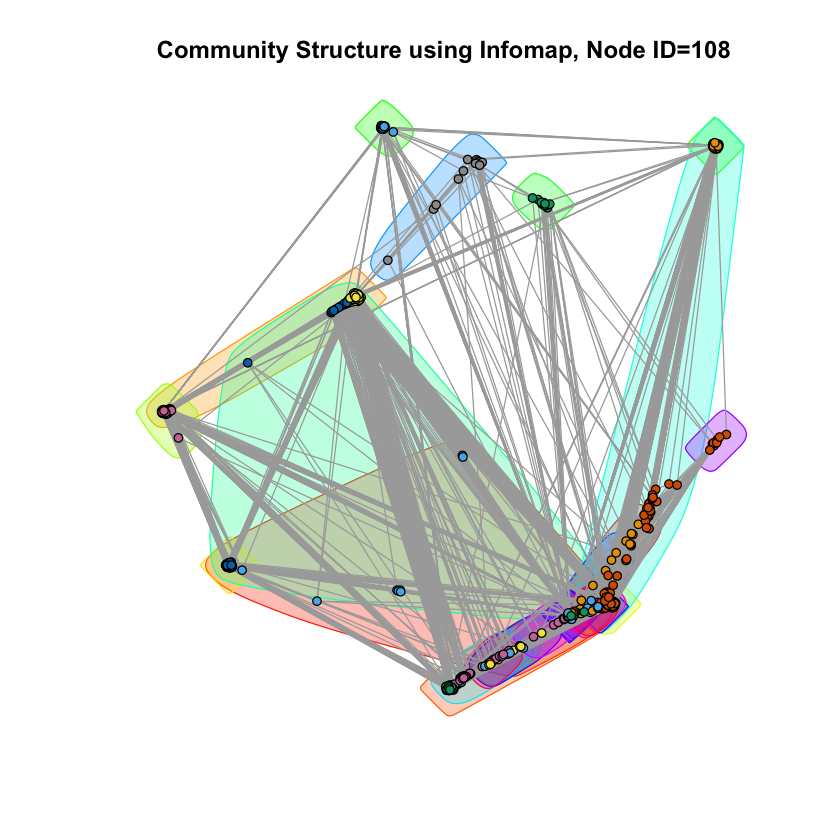

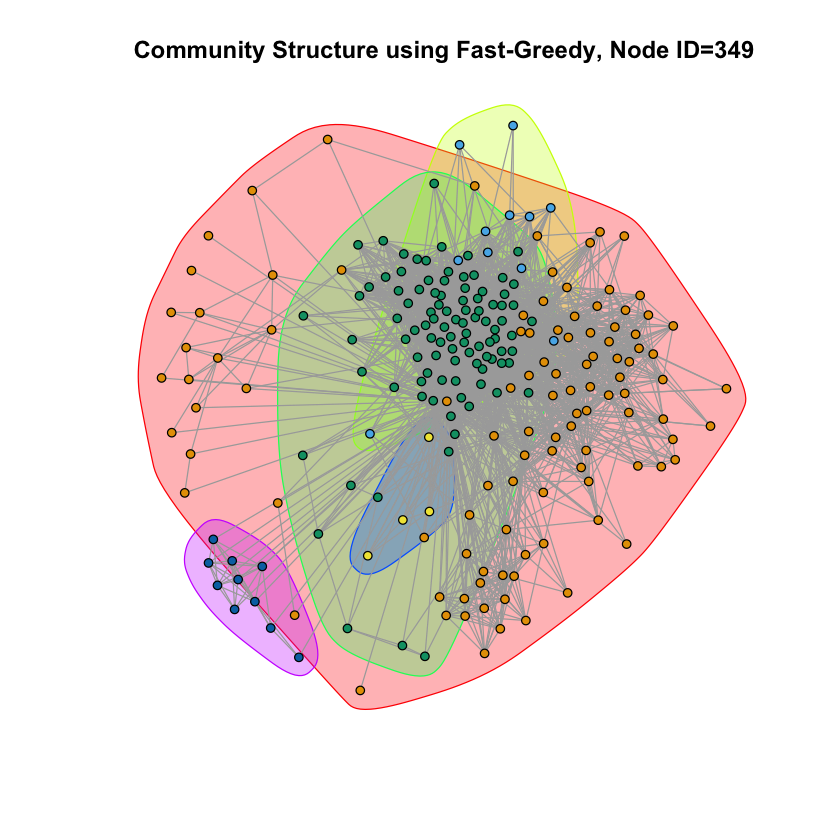

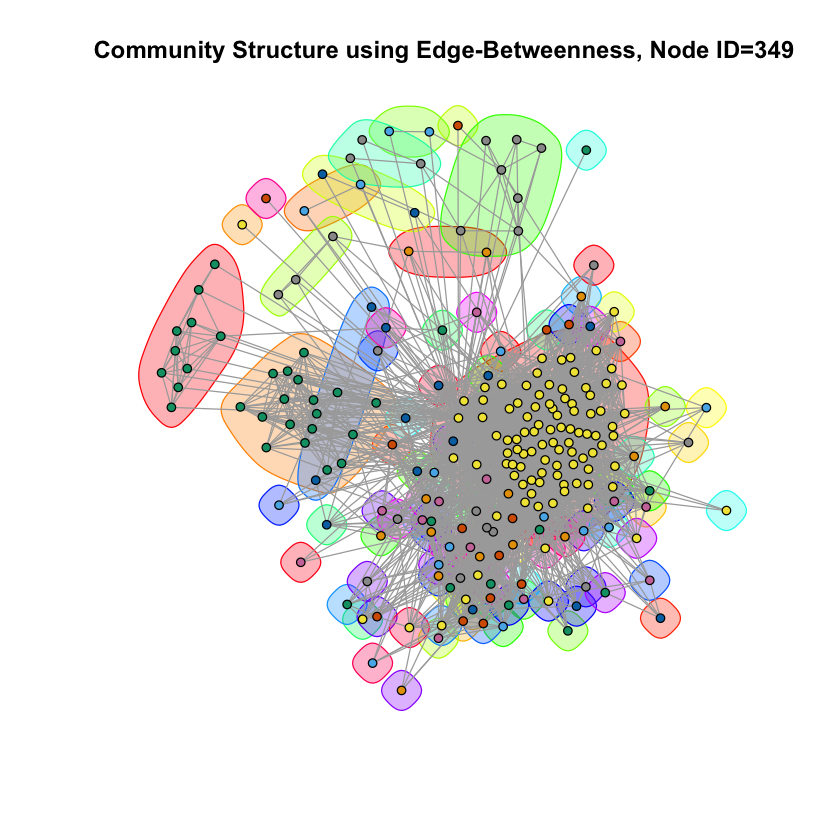

[1] "Node ID: 484"
[1] "Modularity of Fast-Greedy: 0.507002"
[1] "Modularity of Edge-Betweenness: 0.489095"
[1] "Modularity of Infomap: 0.515643"


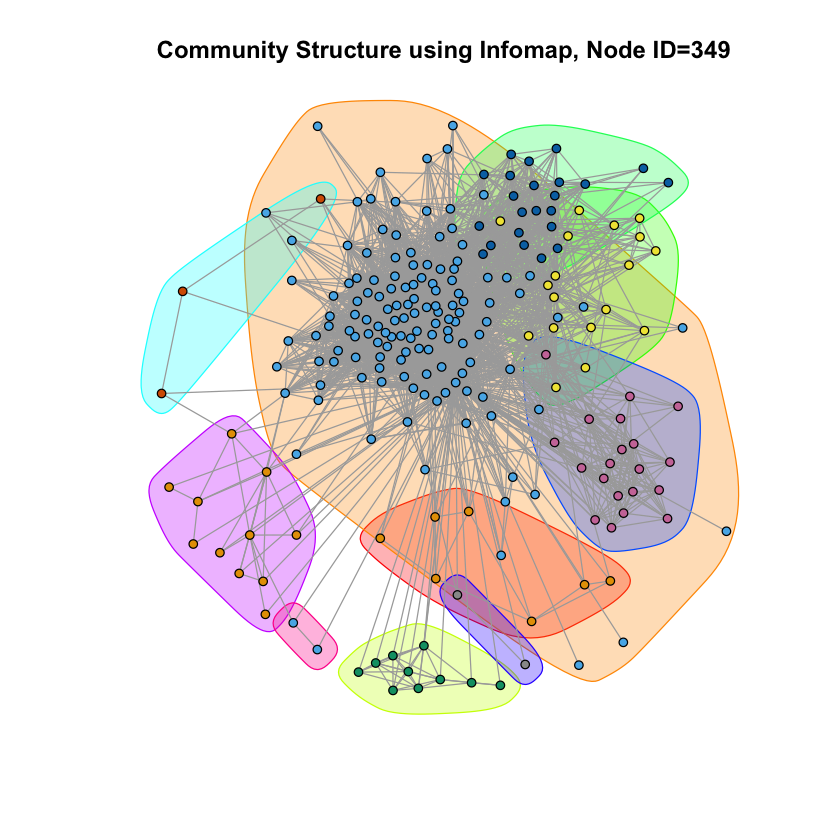

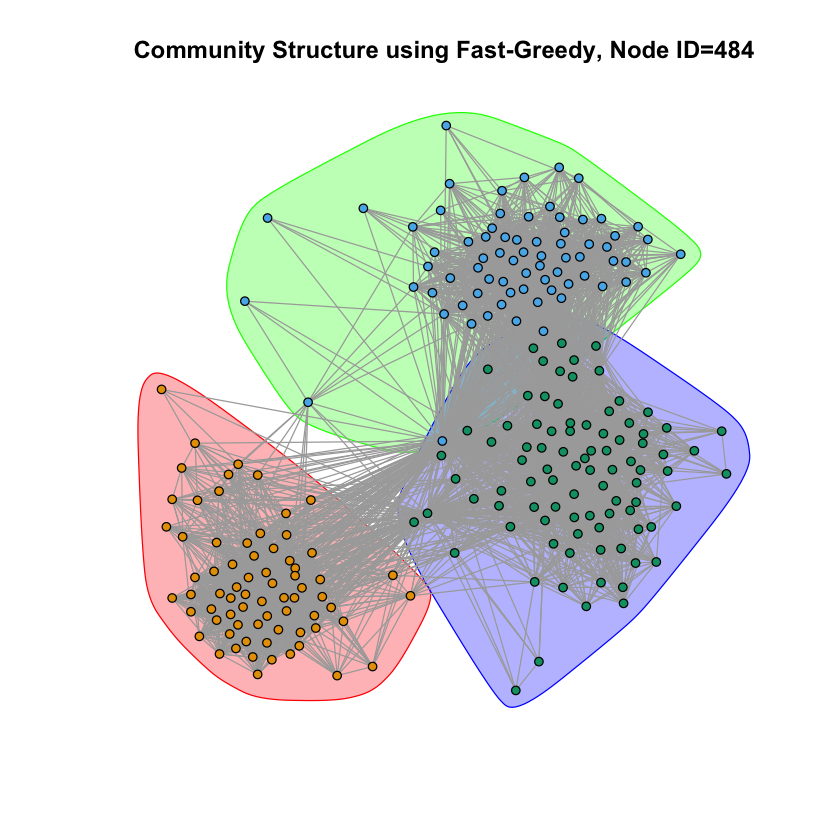

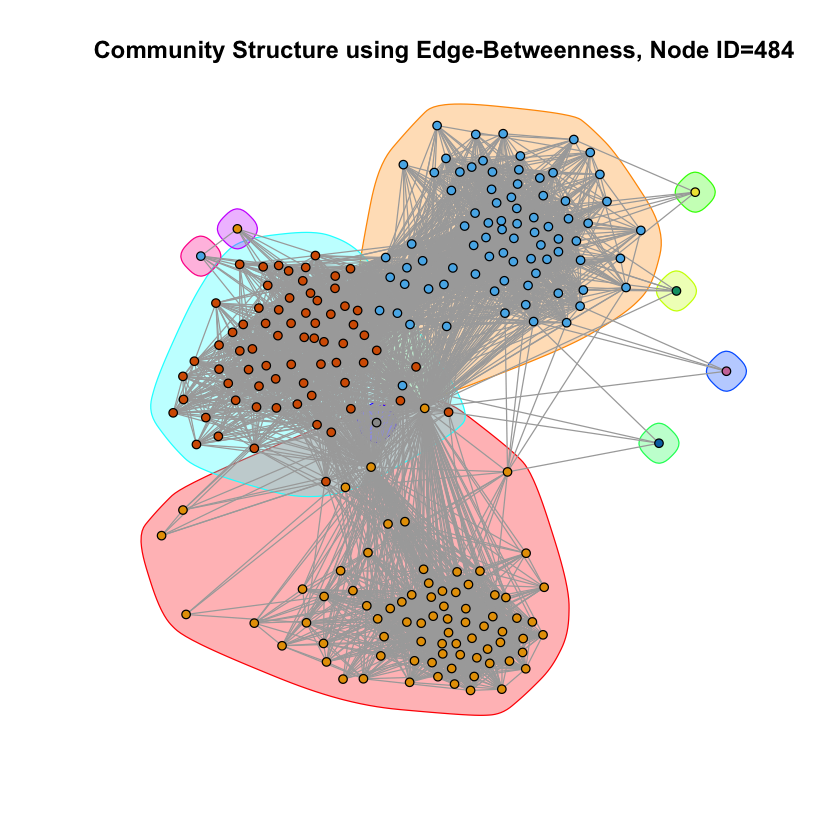

[1] "Node ID: 1087"
[1] "Modularity of Fast-Greedy: 0.145531"
[1] "Modularity of Edge-Betweenness: 0.027624"
[1] "Modularity of Infomap: 0.026905"


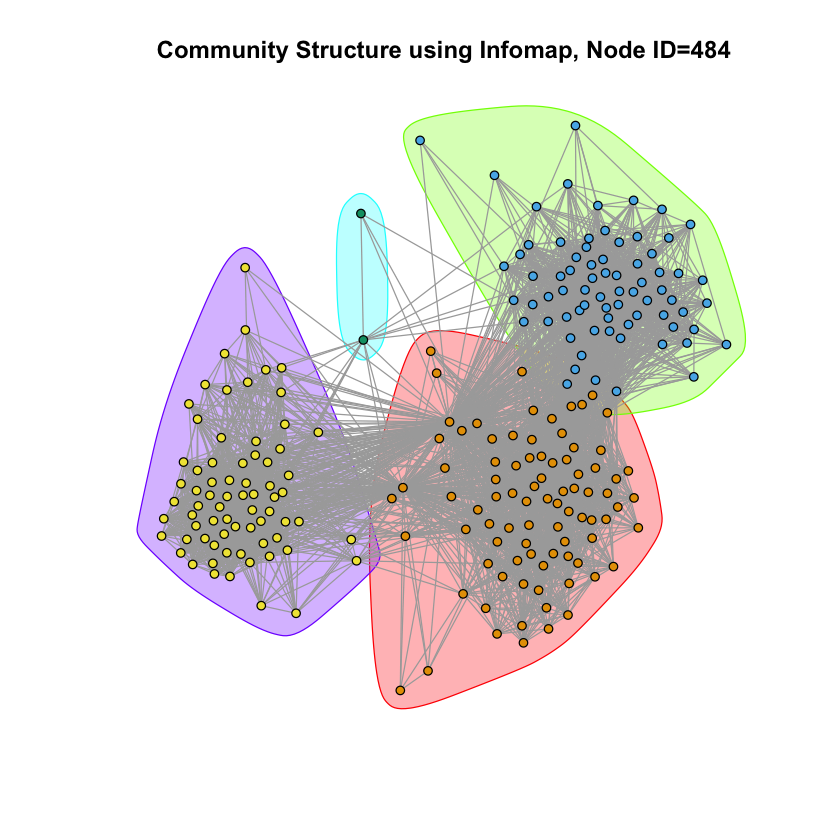

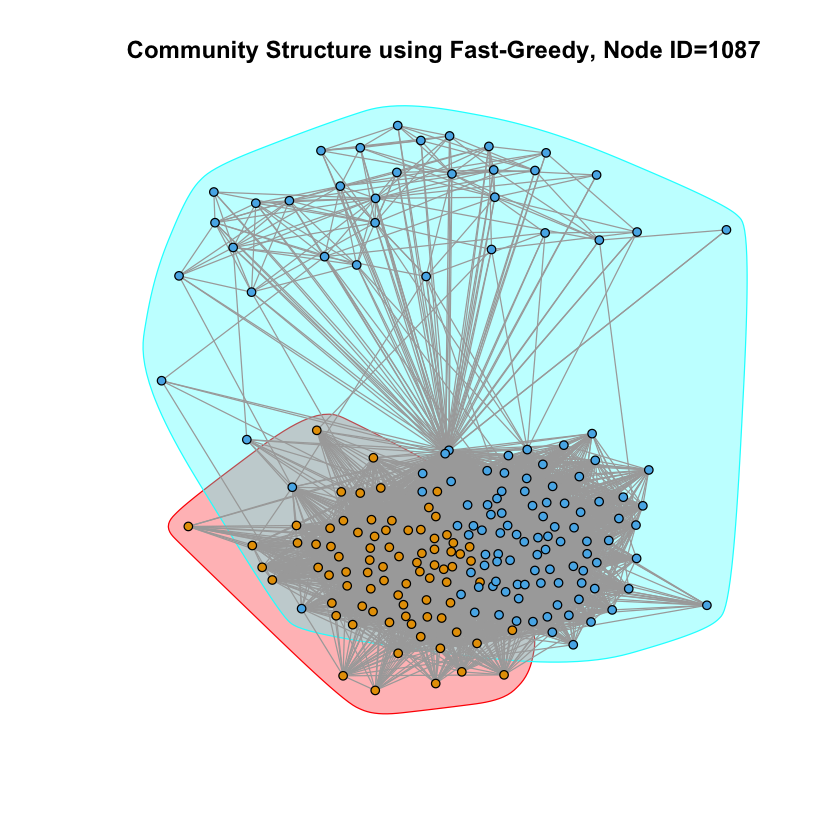

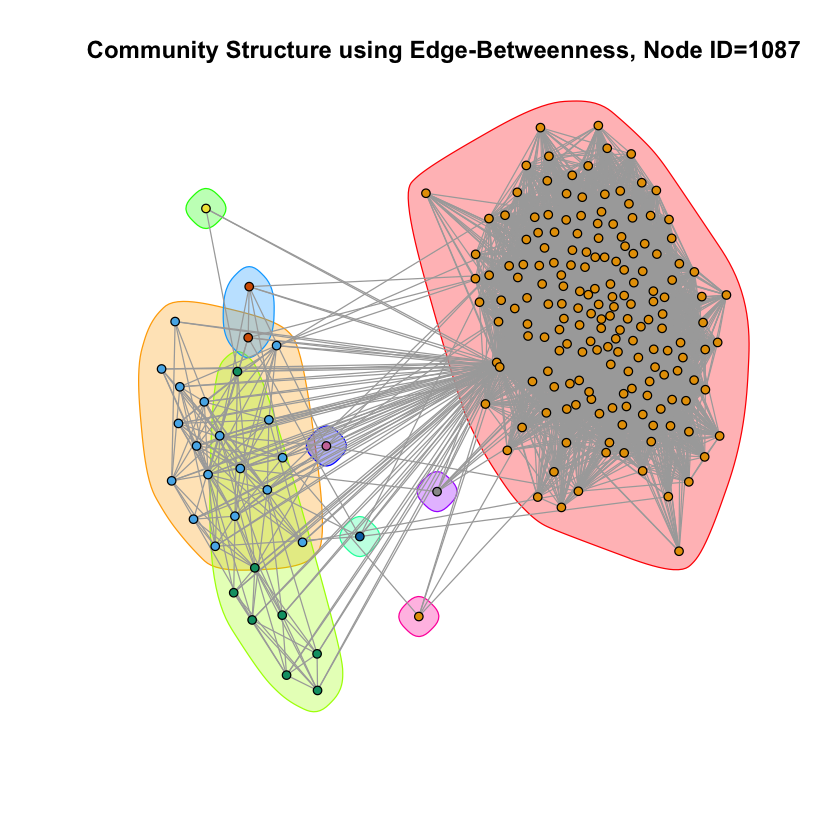

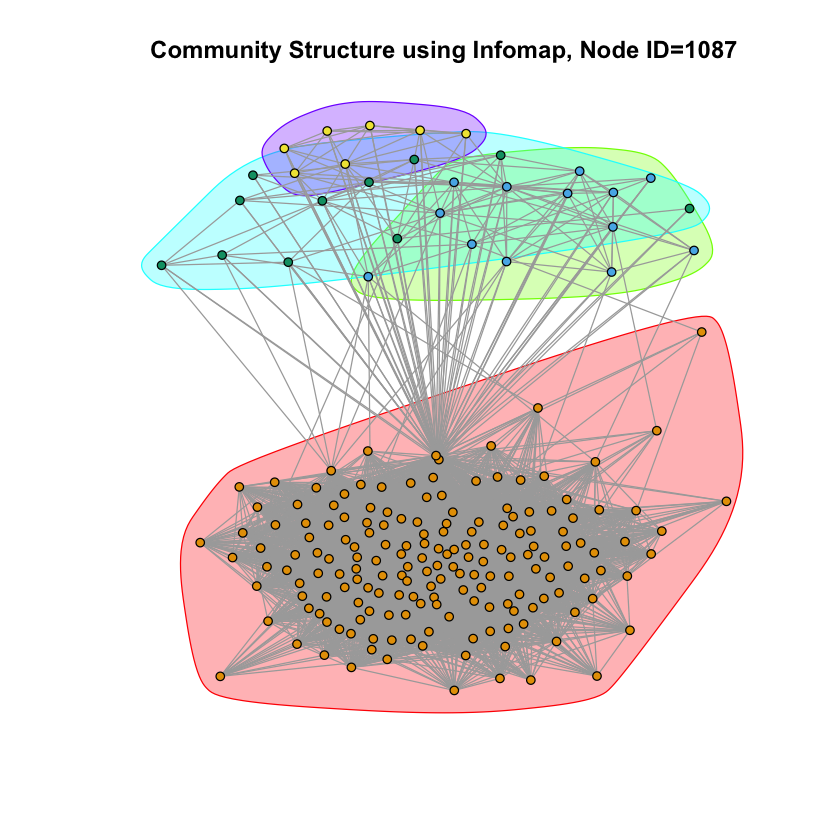

In [149]:
for (i in 1:5) {
    g = personalized_networks[[i]]
    fast_greedy = cluster_fast_greedy(g)
    edge_betweenness = cluster_edge_betweenness(g)
    infomap = cluster_infomap(g)
    
    print(sprintf("Node ID: %.0f", id_list[i]))
    print(sprintf("Modularity of Fast-Greedy: %f", modularity(fast_greedy)))
    print(sprintf("Modularity of Edge-Betweenness: %f", modularity(edge_betweenness)))
    print(sprintf("Modularity of Infomap: %f", modularity(infomap)))

    plot(fast_greedy, g, edge.color='darkgrey', vertex.size=3, vertex.label=NA)
    title(sprintf("Community Structure using Fast-Greedy, Node ID=%.0f", id_list[i]))

    plot(edge_betweenness, g, edge.color='darkgrey', vertex.size=3, vertex.label=NA)
    title(sprintf("Community Structure using Edge-Betweenness, Node ID=%.0f", id_list[i]))

    plot(infomap, g, edge.color='darkgrey', vertex.size=3, vertex.label=NA)
    title(sprintf("Community Structure using Infomap, Node ID=%.0f", id_list[i]))
}

QUESTION 10: For each of the core node’s personalized network (use same core nodes as
Question 9), remove the core node from the personalized network and find the community structure
of the modified personalized network. Use the same community detection algorithm as Question 9.
Compare the modularity score of the community structure of the modified personalized network with
the modularity score of the community structure of the personalized network of Question 9. For
visualization purpose, display the community structure of the modified personalized network using
colors. In this question, you should have 15 plots in total.

[1] "Node ID: 1"
[1] "Modularity of Fast-Greedy: 0.441853"
[1] "Modularity of Edge-Betweenness: 0.416146"
[1] "Modularity of Infomap: 0.418008"


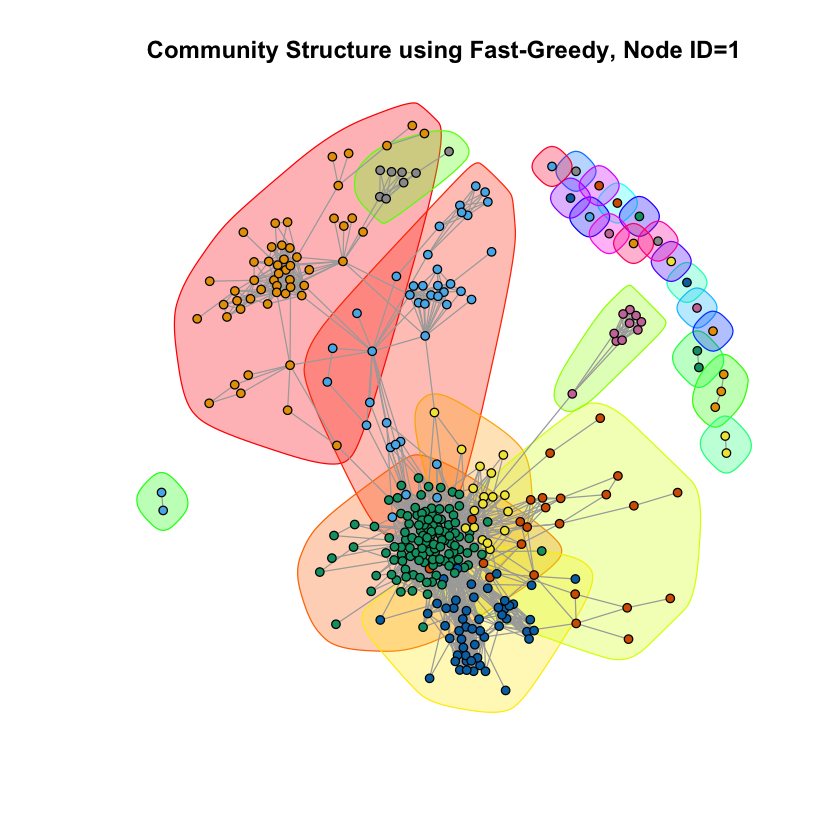

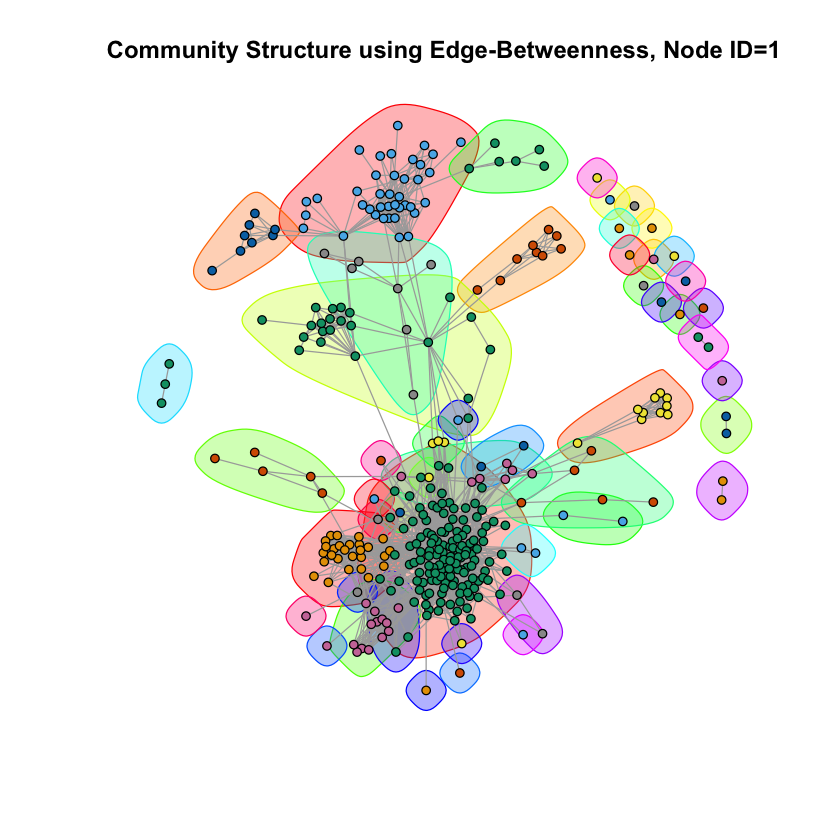

[1] "Node ID: 108"
[1] "Modularity of Fast-Greedy: 0.458127"
[1] "Modularity of Edge-Betweenness: 0.521322"
[1] "Modularity of Infomap: 0.520517"


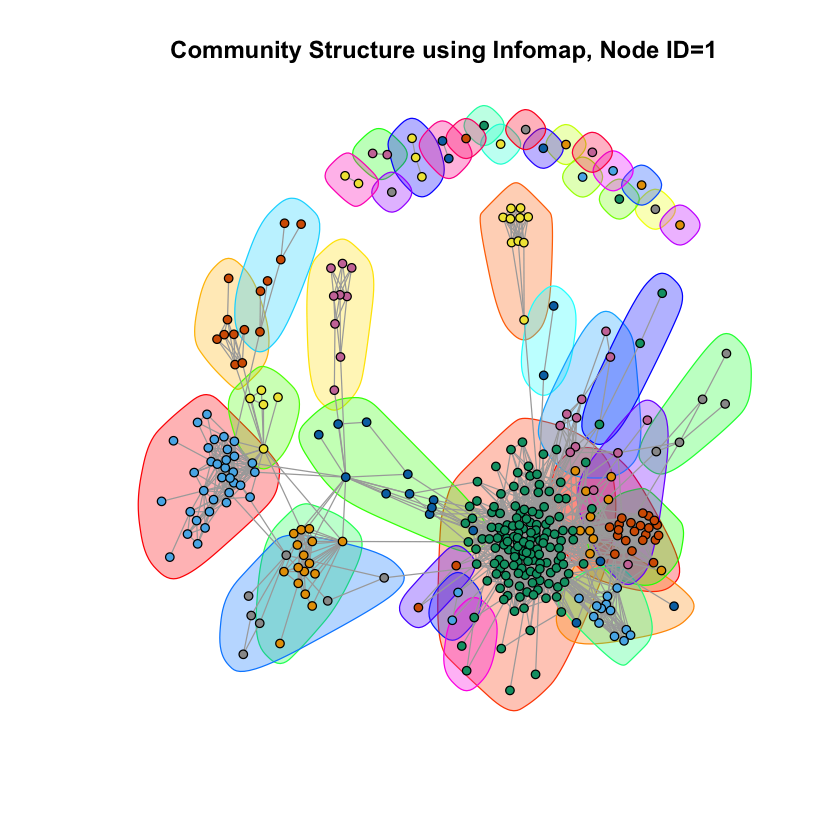

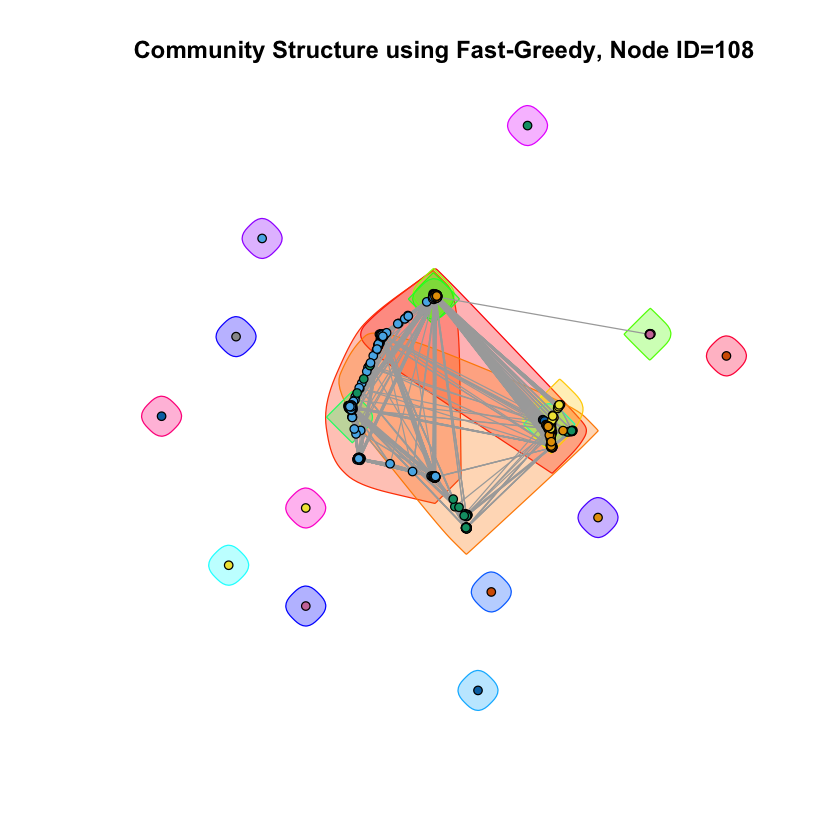

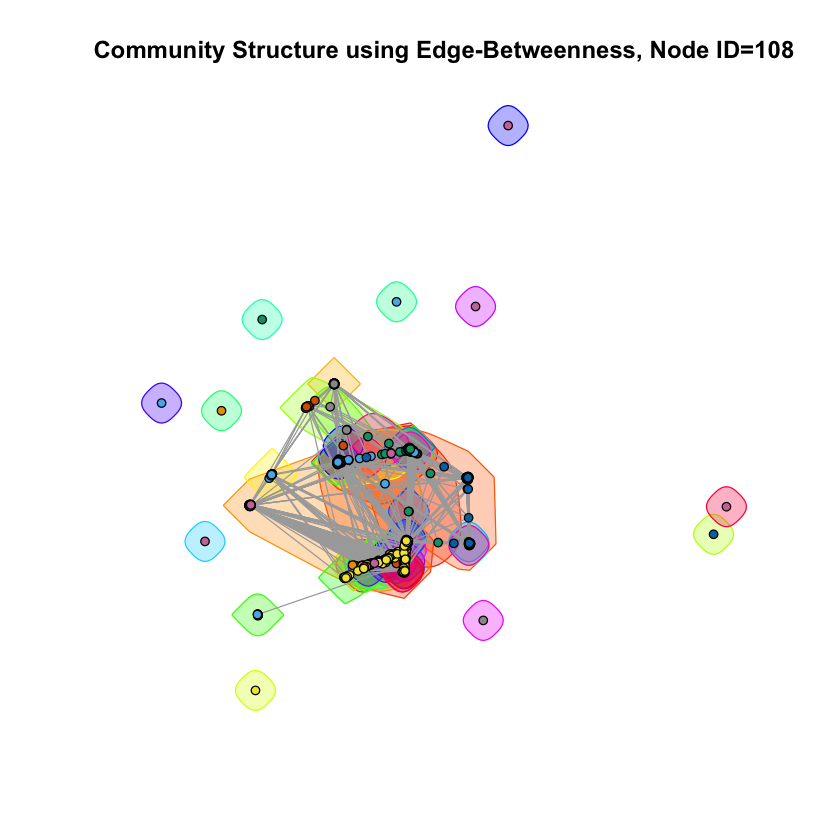

[1] "Node ID: 349"
[1] "Modularity of Fast-Greedy: 0.245692"
[1] "Modularity of Edge-Betweenness: 0.150566"
[1] "Modularity of Infomap: 0.244816"


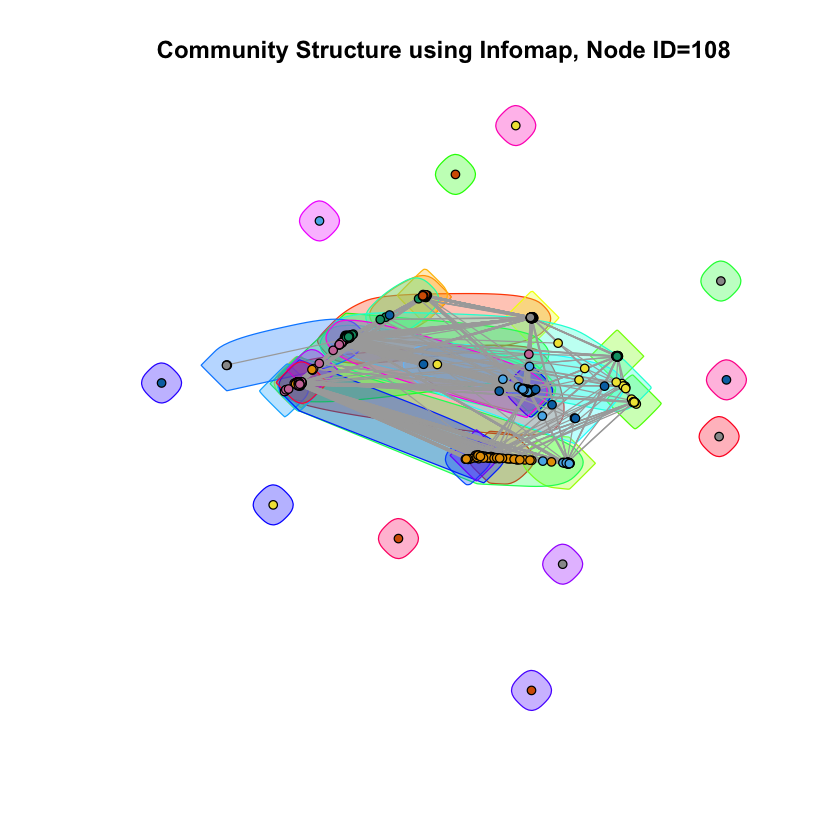

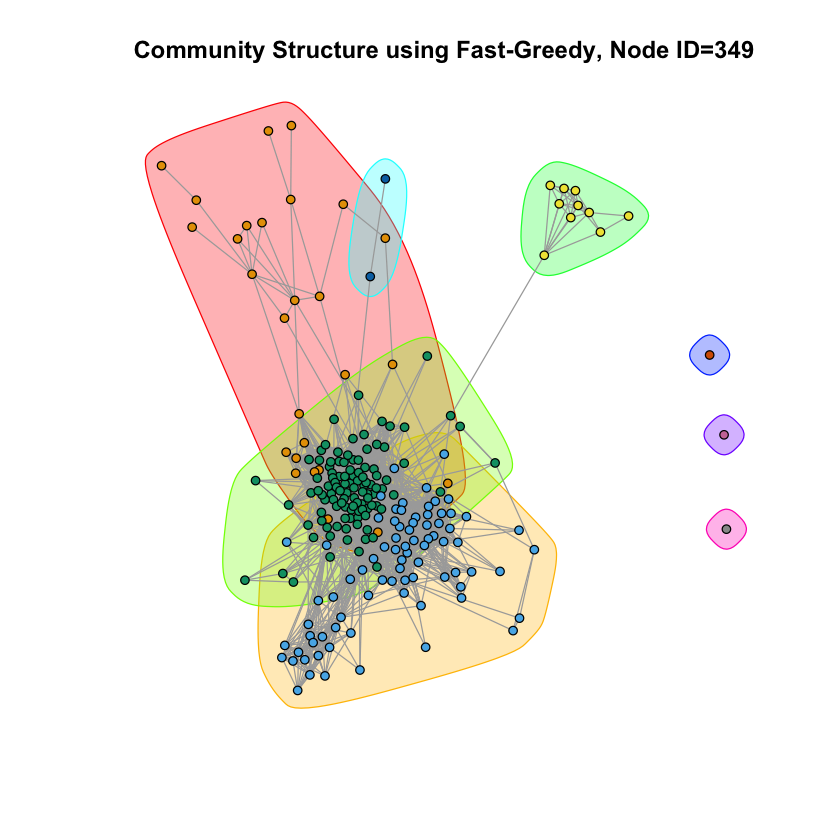

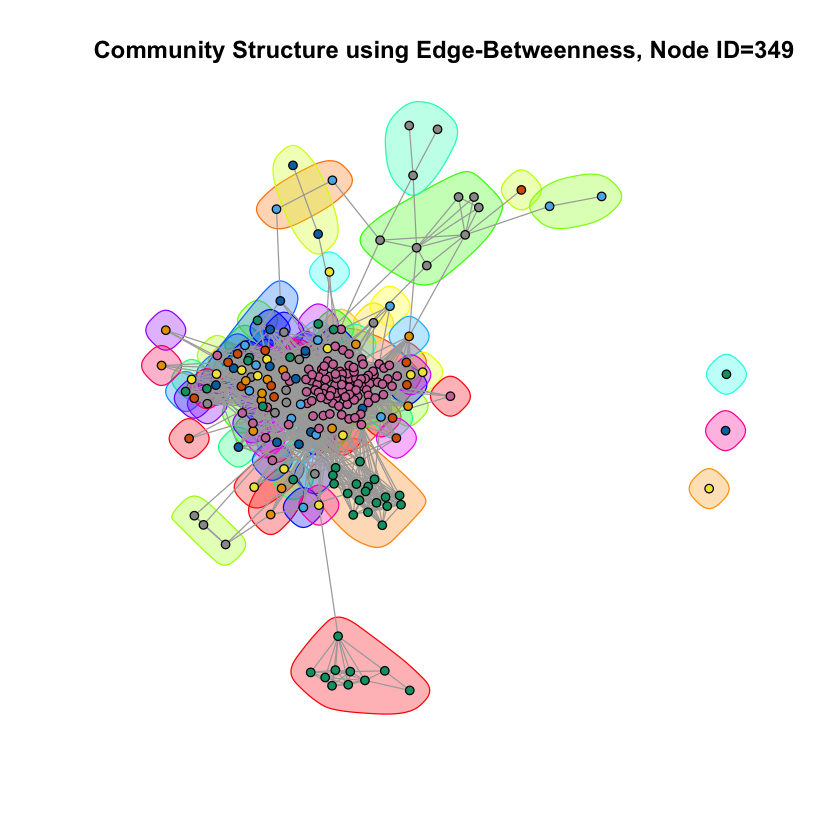

[1] "Node ID: 484"
[1] "Modularity of Fast-Greedy: 0.534214"
[1] "Modularity of Edge-Betweenness: 0.515441"
[1] "Modularity of Infomap: 0.543444"


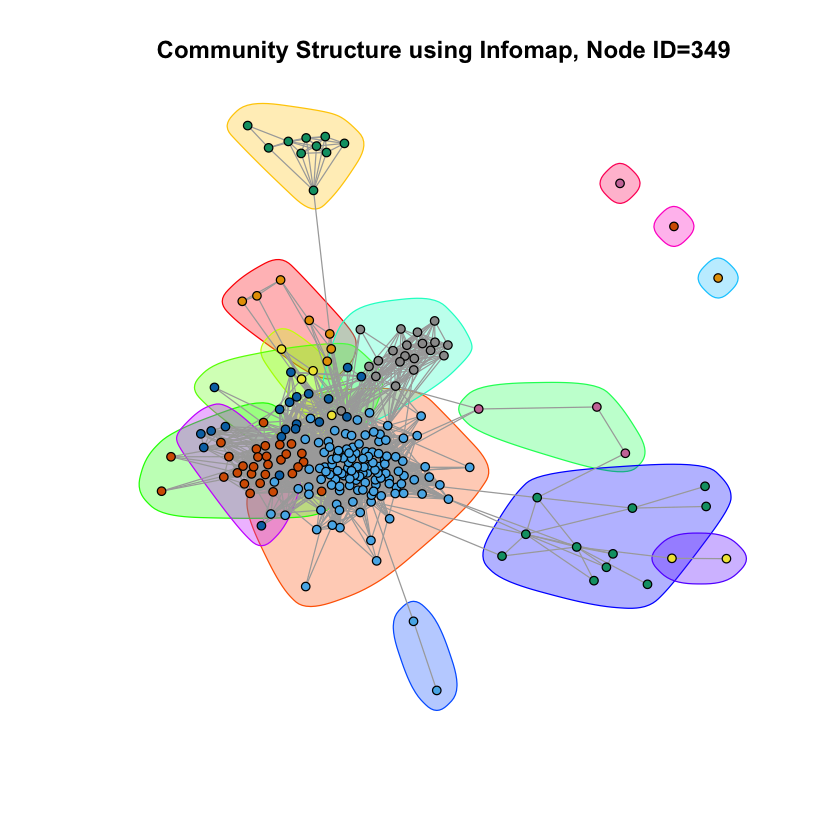

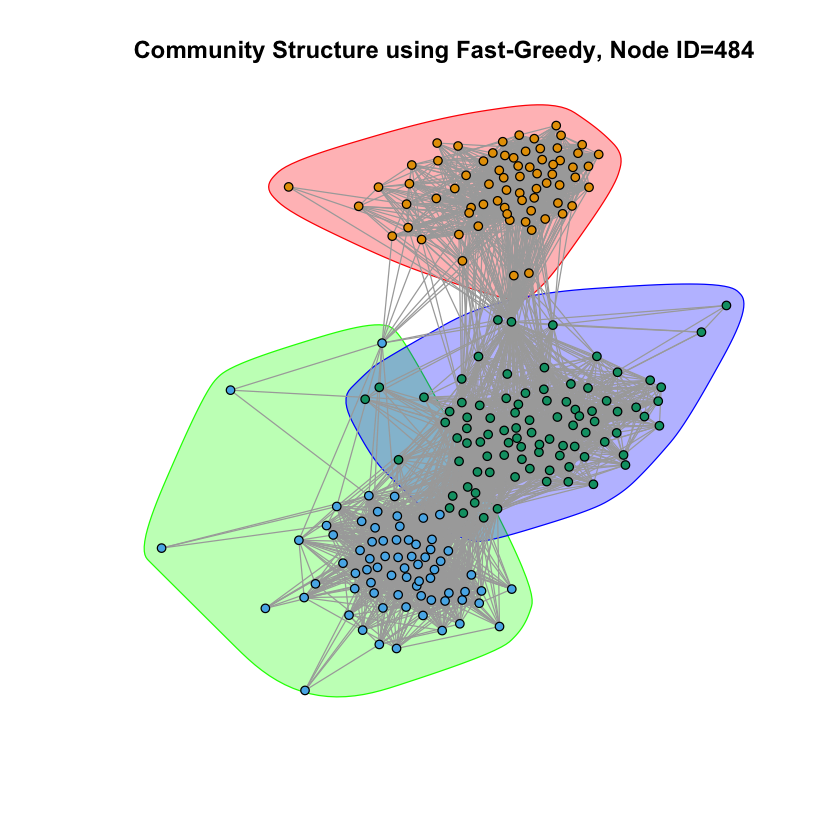

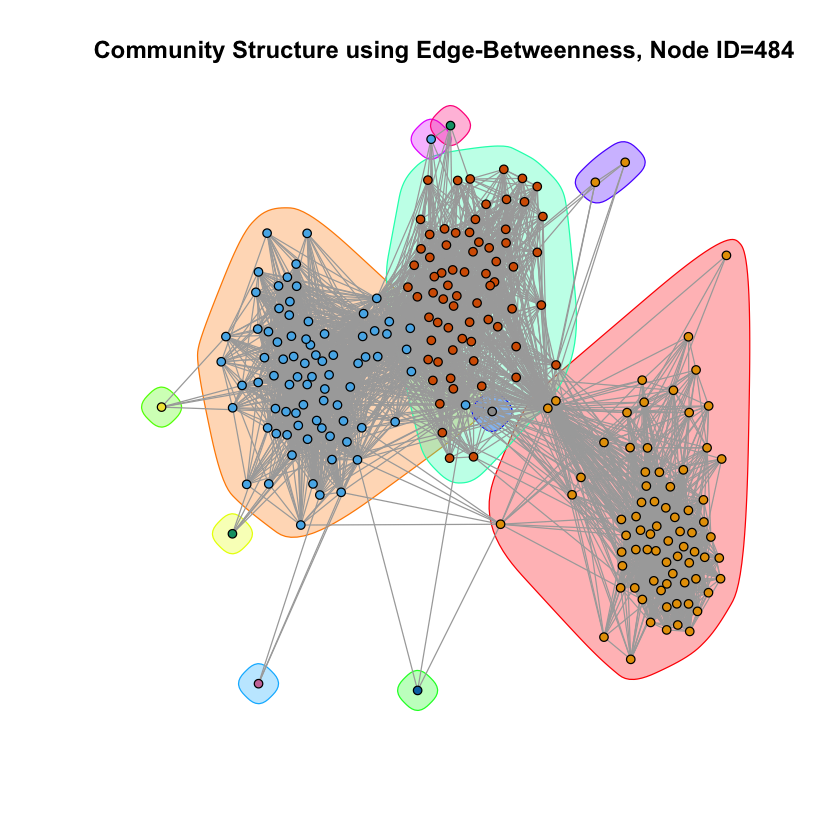

[1] "Node ID: 1087"
[1] "Modularity of Fast-Greedy: 0.148196"
[1] "Modularity of Edge-Betweenness: 0.032495"
[1] "Modularity of Infomap: 0.027372"


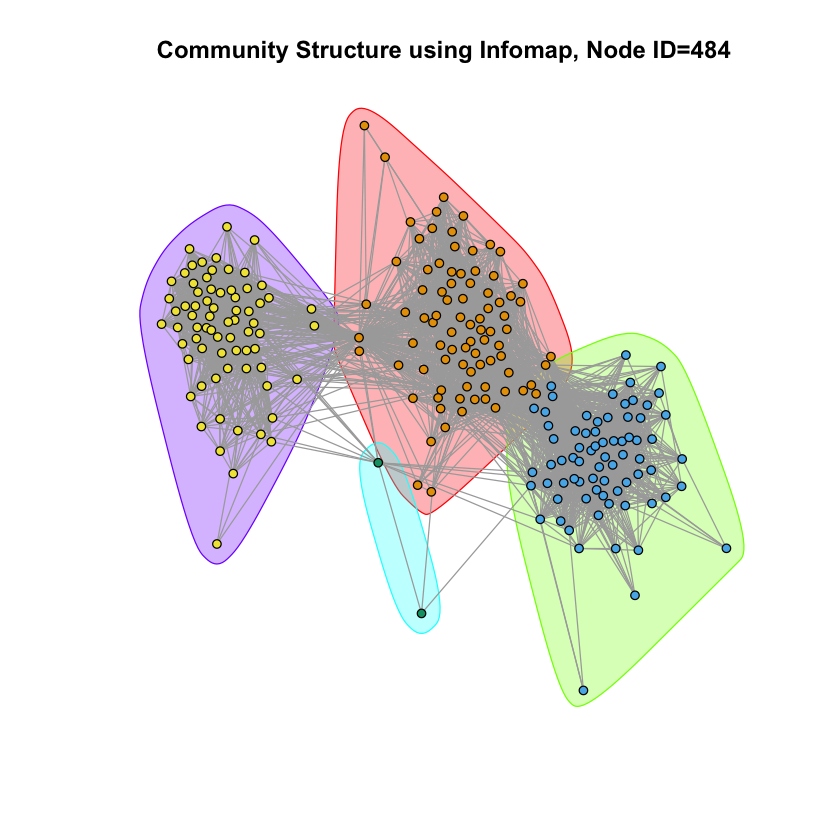

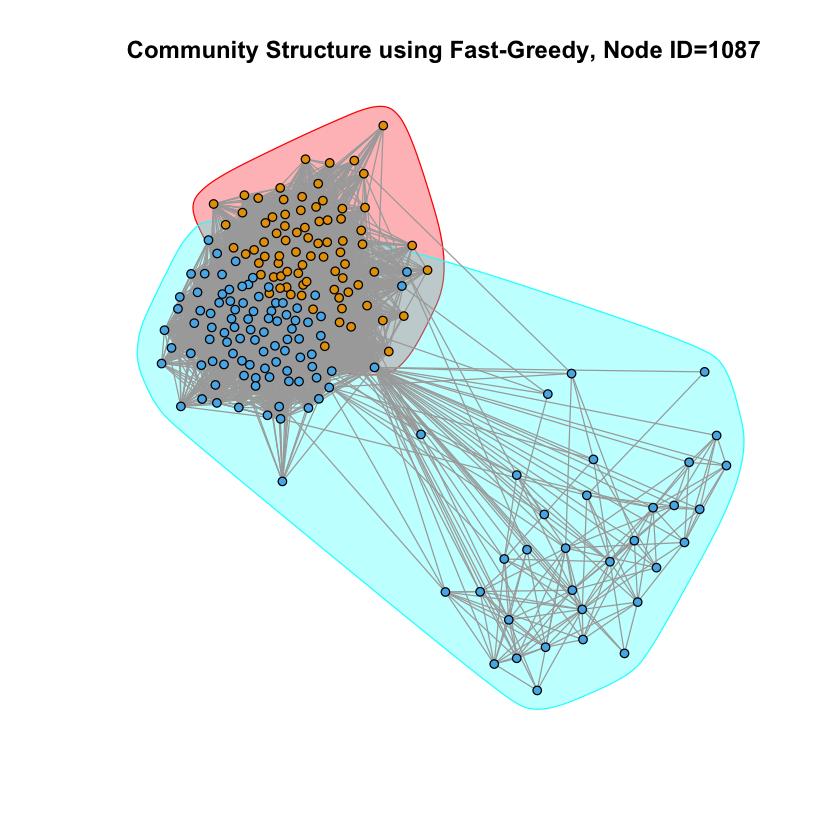

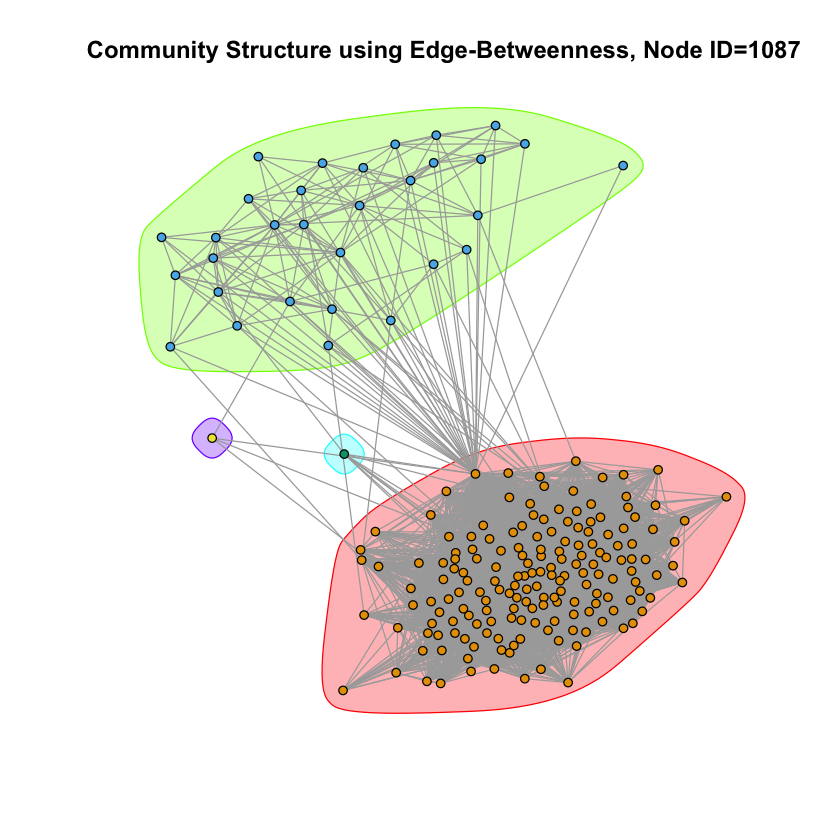

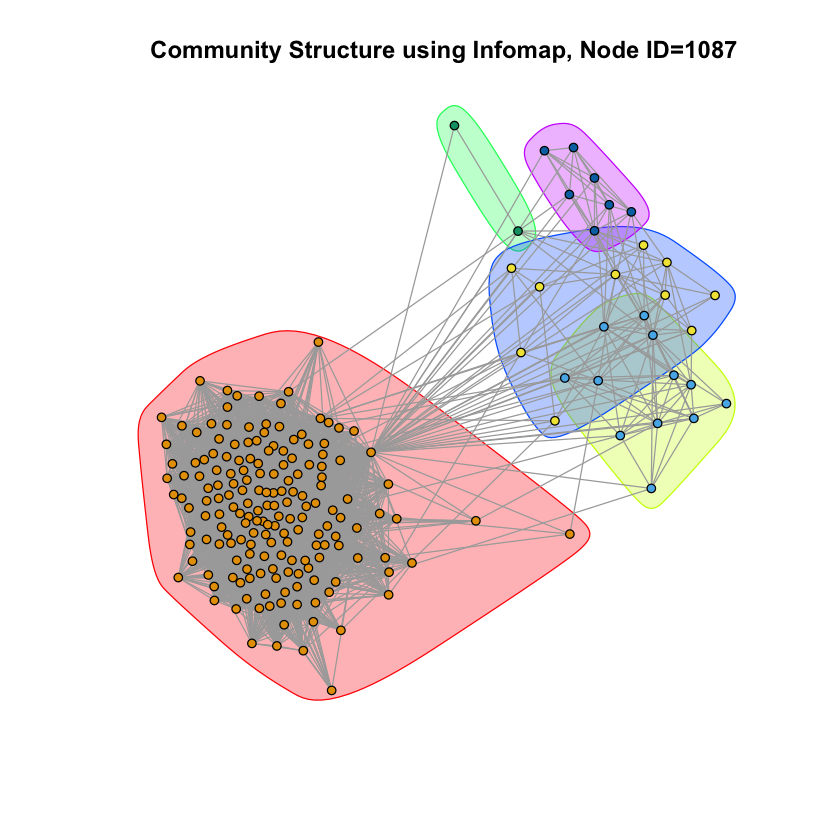

In [150]:
for (i in 1:5) {
    g = induced_subgraph(facebook_network, neighbors(facebook_network, id_list[i]))
    fast_greedy = cluster_fast_greedy(g)
    edge_betweenness = cluster_edge_betweenness(g)
    infomap = cluster_infomap(g)
    
    print(sprintf("Node ID: %.0f", id_list[i]))
    print(sprintf("Modularity of Fast-Greedy: %f", modularity(fast_greedy)))
    print(sprintf("Modularity of Edge-Betweenness: %f", modularity(edge_betweenness)))
    print(sprintf("Modularity of Infomap: %f", modularity(infomap)))

    plot(fast_greedy, g, edge.color='darkgrey', vertex.size=3, vertex.label=NA)
    title(sprintf("Community Structure using Fast-Greedy, Node ID=%.0f", id_list[i]))

    plot(edge_betweenness, g, edge.color='darkgrey', vertex.size=3, vertex.label=NA)
    title(sprintf("Community Structure using Edge-Betweenness, Node ID=%.0f", id_list[i]))

    plot(infomap, g, edge.color='darkgrey', vertex.size=3, vertex.label=NA)
    title(sprintf("Community Structure using Infomap, Node ID=%.0f", id_list[i]))
}